## Import libraries

In [ ]:
import os
import matplotlib.pyplot as plt
import numpy as np
import cv2
import pandas as pd
import skimage
# import warnings

!pip install dippykit -q
import dippykit as dip # from skimage.metrics import structural_similarity as compare_ssim

# warnings.filterwarnings("ignore", category=UserWarning)

## Load sample image pairs:

In [ ]:
root = "/content/drive/MyDrive/ECE6258/Paired"
folder = 'underwater_scenes'
path = root + '/' + folder

files1 = np.sort(os.listdir(os.path.join(path,"trainA")))
files2 = np.sort(os.listdir(os.path.join(path,"trainB")))
print(files1[0:3]) # First three files
print(files2[0:3]) # First three files

['im_f1000_.jpg' 'im_f1001_.jpg' 'im_f1002_.jpg']
['im_f1000_.jpg' 'im_f1001_.jpg' 'im_f1002_.jpg']


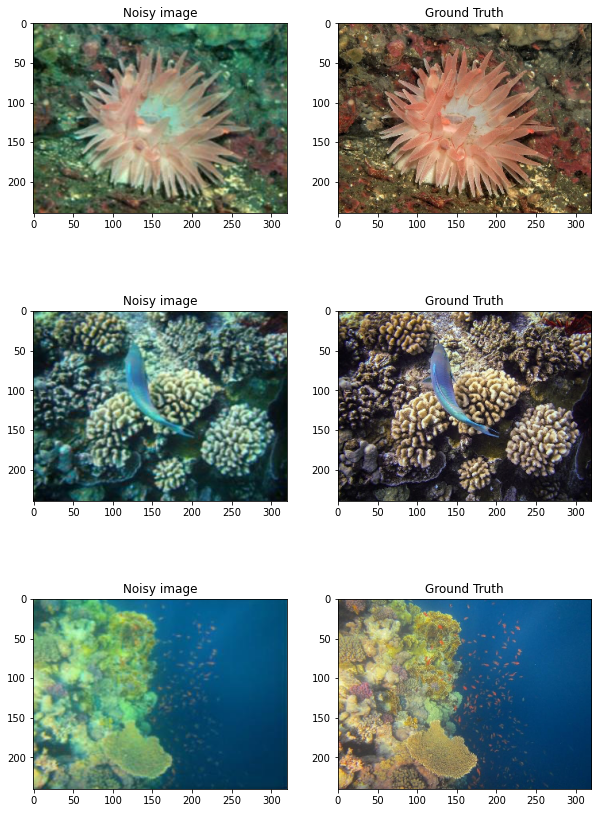

In [ ]:
# Plot 3 random pairs
ss=1
plt.figure(figsize = (10,15))
for i in np.random.randint(1,1000,3):
    img1 = plt.imread(os.path.join(path,"trainA",files1[i]))
    img2 = plt.imread(os.path.join(path,"trainB",files2[i]))
    plt.subplot(3,2,ss) ; ss=ss+1
    plt.imshow(img1)
    plt.title("Noisy image")
    plt.subplot(3,2,ss) ; ss=ss+1
    plt.imshow(img2)
    plt.title("Ground Truth")
plt.show()

## Metrics: PSNR, SSIM , UCIQE, UIQM

In [ ]:
# dip.PSNR
# dip.SSIM

# def rgb2lab_n(rgb):
#     # %RGB2LAB Convert an image from RGB to CIELAB
#     # %
#     # % function [L, a, b] = RGB2Lab(R, G, B)
#     # % function [L, a, b] = RGB2Lab(I)
#     # % function I = RGB2Lab(...)
#     # %
#     # % RGB2Lab takes red, green, and blue matrices, or a single M x N x 3 image, 
#     # % and returns an image in the CIELAB color space.  RGB values can be
#     # % either between 0 and 1 or between 0 and 255.  Values for L are in the
#     # % range [0,100] while a and b are roughly in the range [-110,110].  The
#     # % output is of type double.
#     # %
#     # % This transform is based on ITU-R Recommendation BT.709 using the D65
#     # % white point reference. The error in transforming RGB -> Lab -> RGB is
#     # % approximately 10^-5.  
#     # %
#     # % See also LAB2RGB.
#     # % By Mark Ruzon from C code by Yossi Rubner, 23 September 1997.
#     # % Updated for MATLAB 5 28 January 1998.
#     # % Updated for MATLAB 7 30 March 2009.
    
#     R = rgb[:,:,0]
#     G = rgb[:,:,1]
#     B = rgb[:,:,2]

#     # % Set a threshold
#     T = 0.008856
#     M, N = R.shape
#     s = M * N
#     RGB = np.vstack((R.reshape(-1),G.reshape(-1),B.reshape(-1)))
#     # % RGB to XYZ
#     MAT = np.array([[0.412453, 0.357580, 0.180423],
#                     [0.212671, 0.715160, 0.072169],
#                     [0.019334, 0.119193, 0.950227]])
#     XYZ = MAT @ RGB

#     # % Normalize for D65 white point
#     X = XYZ[0,:] / 0.950456
#     Y = XYZ[1,:]
#     Z = XYZ[2,:] / 1.088754

#     XT = X > T
#     YT = Y > T
#     ZT = Z > T

#     Y3 = Y ** (1/3)

#     fX = XT * X**(1/3) + (~XT) * (7.787 * X + 16/116)
#     fY = YT * Y3 + (~YT) * (7.787 * Y + 16/116)
#     fZ = ZT * Z**(1/3) + (~ZT) * (7.787 * Z + 16/116)

#     L = np.reshape(YT * (116 * Y3 - 16.0) + (~YT) * (903.3 * Y), (M, N))
#     a = np.reshape(500 * (fX - fY), (M, N))
#     b = np.reshape(200 * (fY - fZ), (M, N))

#     return L,a,b

# def UCIQE(rgb_in, c1=0.4680, c2=0.2745, c3=0.2576):
#     # %Calculate UCIQE (Underwater Colour Image Quality Evaluation).
#     # %
#     # %Usage
#     # %     UCIQE_value = UCIQE(RGB_Image)
#     # %  The implemented algorithm is based on the paper of M. Yang et al.:
#     # %  An Underwater Color Image Quality Evaluation Metric.
#     # %
#     # % Implemented by Z. J. Wang, UAV Lab, National University of Singapore
#     # % Sept. 2018
#     # % Modified at Dec. 2019

#     if(np.max(rgb_in) > 1):
#         rgb_in = rgb_in/255.0

#     l,a,b = rgb2lab_n(rgb_in)

#     chroma = np.sqrt(a**2 + b**2)
#     # % average of chroma
#     u_c = np.mean(chroma)
#     # % variance of chroma
#     sigma_c = np.sqrt(np.mean(chroma**2 - u_c**2))

#     saturation = chroma / (l + 0.0001)
#     # % average of saturation
#     u_s = np.mean(saturation)

#     contrast_l = np.max(l)-np.min(l)

#     UCIQE = c1 * sigma_c + c2 * contrast_l + c3 *  u_s

#     return UCIQE

def UCIQE(img, c1=0.4680, c2=0.2745, c3=0.2576):
    # rgb = a
    # a = a/255
    
    lab = skimage.color.rgb2lab(img)
    # lab = cv2.cvtColor(img, cv2.COLOR_RGB2LAB)

    # gray = skimage.color.rgb2gray(a)
    # UCIQE
    l = lab[:,:,0]

    #1st term
    chroma = (lab[:,:,1]**2 + lab[:,:,2]**2)**0.5
    uc = np.mean(chroma)
    sc = (np.mean((chroma - uc)**2))**0.5

    #2nd term
    top = np.int(np.round(0.01*l.shape[0]*l.shape[1]))
    sl = np.sort(l,axis=None)
    isl = sl[::-1]
    conl = np.mean(isl[::top])-np.mean(sl[::top])

    #3rd term
    satur = []
    chroma1 = chroma.flatten()
    l1 = l.flatten()
    for i in range(len(l1)):
        if chroma1[i] == 0: satur.append(0)
        elif l1[i] == 0: satur.append(0)
        else: satur.append(chroma1[i] / l1[i])

    us = np.mean(satur)

    UCIQE = c1 * sc + c2 * conl + c3 * us
    return UCIQE

In [ ]:
"""
# > Modules for computing the Underwater Image Quality Measure (UIQM)
# Maintainer: Jahid (email: islam034@umn.edu)
"""
from scipy import ndimage
from PIL import Image
import math

def mu_a(x, alpha_L=0.1, alpha_R=0.1):
    """
      Calculates the asymetric alpha-trimmed mean
    """
    # sort pixels by intensity - for clipping
    x = sorted(x)
    # get number of pixels
    K = len(x)
    # calculate T alpha L and T alpha R
    T_a_L = math.ceil(alpha_L*K)
    T_a_R = math.floor(alpha_R*K)
    # calculate mu_alpha weight
    weight = (1/(K-T_a_L-T_a_R))
    # loop through flattened image starting at T_a_L+1 and ending at K-T_a_R
    s   = int(T_a_L+1)
    e   = int(K-T_a_R)
    val = sum(x[s:e])
    val = weight*val
    return val

def s_a(x, mu):
    val = 0
    for pixel in x:
        val += math.pow((pixel-mu), 2)
    return val/len(x)

def _uicm(x):
    R = x[:,:,0].flatten()
    G = x[:,:,1].flatten()
    B = x[:,:,2].flatten()
    RG = R-G
    YB = ((R+G)/2)-B
    mu_a_RG = mu_a(RG)
    mu_a_YB = mu_a(YB)
    s_a_RG = s_a(RG, mu_a_RG)
    s_a_YB = s_a(YB, mu_a_YB)
    l = math.sqrt( (math.pow(mu_a_RG,2)+math.pow(mu_a_YB,2)) )
    r = math.sqrt(s_a_RG+s_a_YB)
    return (-0.0268*l)+(0.1586*r)

def sobel(x):
    dx = ndimage.sobel(x,0)
    dy = ndimage.sobel(x,1)
    mag = np.hypot(dx, dy)
    mag *= 255.0 / np.max(mag) 
    return mag

def eme(x, window_size):
    """
      Enhancement measure estimation
      x.shape[0] = height
      x.shape[1] = width
    """
    # if 4 blocks, then 2x2...etc.
    k1 = int(x.shape[1]/window_size)
    k2 = int(x.shape[0]/window_size)
    # weight
    w = 2./(k1*k2)
    blocksize_x = window_size
    blocksize_y = window_size
    # make sure image is divisible by window_size - doesn't matter if we cut out some pixels
    x = x[:blocksize_y*k2, :blocksize_x*k1]
    val = 0
    for l in range(k1):
        for k in range(k2):
            block = x[k*window_size:window_size*(k+1), l*window_size:window_size*(l+1)]
            max_ = np.max(block)
            min_ = np.min(block)
            # bound checks, can't do log(0)
            if min_ == 0.0: val += 0
            elif max_ == 0.0: val += 0
            else: val += math.log(max_/min_)
    return w*val

def _uism(x):
    """
      Underwater Image Sharpness Measure
    """
    # get image channels
    R = x[:,:,0]
    G = x[:,:,1]
    B = x[:,:,2]
    # first apply Sobel edge detector to each RGB component
    Rs = sobel(R)
    Gs = sobel(G)
    Bs = sobel(B)
    # multiply the edges detected for each channel by the channel itself
    R_edge_map = np.multiply(Rs, R)
    G_edge_map = np.multiply(Gs, G)
    B_edge_map = np.multiply(Bs, B)
    # get eme for each channel
    r_eme = eme(R_edge_map, 10)
    g_eme = eme(G_edge_map, 10)
    b_eme = eme(B_edge_map, 10)
    # coefficients
    lambda_r = 0.299
    lambda_g = 0.587
    lambda_b = 0.144
    return (lambda_r*r_eme) + (lambda_g*g_eme) + (lambda_b*b_eme)

def plip_g(x,mu=1026.0):
    return mu-x

def plip_theta(g1, g2, k):
    g1 = plip_g(g1)
    g2 = plip_g(g2)
    return k*((g1-g2)/(k-g2))

def plip_cross(g1, g2, gamma):
    g1 = plip_g(g1)
    g2 = plip_g(g2)
    return g1+g2-((g1*g2)/(gamma))

def plip_diag(c, g, gamma):
    g = plip_g(g)
    return gamma - (gamma * math.pow((1 - (g/gamma) ), c) )

def plip_multiplication(g1, g2):
    return plip_phiInverse(plip_phi(g1) * plip_phi(g2))
    #return plip_phiInverse(plip_phi(plip_g(g1)) * plip_phi(plip_g(g2)))

def plip_phiInverse(g):
    plip_lambda = 1026.0
    plip_beta   = 1.0
    return plip_lambda * (1 - math.pow(math.exp(-g / plip_lambda), 1 / plip_beta));

def plip_phi(g):
    plip_lambda = 1026.0
    plip_beta   = 1.0
    return -plip_lambda * math.pow(math.log(1 - g / plip_lambda), plip_beta)

def _uiconm(x, window_size):
    """
      Underwater image contrast measure
      https://github.com/tkrahn108/UIQM/blob/master/src/uiconm.cpp
      https://ieeexplore.ieee.org/abstract/document/5609219
    """
    plip_lambda = 1026.0
    plip_gamma  = 1026.0
    plip_beta   = 1.0
    plip_mu     = 1026.0
    plip_k      = 1026.0
    # if 4 blocks, then 2x2...etc.
    k1 = int(x.shape[1]/window_size)
    k2 = int(x.shape[0]/window_size)
    # weight
    w = -1./(k1*k2)
    blocksize_x = window_size
    blocksize_y = window_size
    # make sure image is divisible by window_size - doesn't matter if we cut out some pixels
    x = x[:blocksize_y*k2, :blocksize_x*k1]
    # entropy scale - higher helps with randomness
    alpha = 1
    val = 0
    for l in range(k1):
        for k in range(k2):
            block = x[k*window_size:window_size*(k+1), l*window_size:window_size*(l+1), :]
            max_ = np.max(block)
            min_ = np.min(block)
            top = max_-min_
            bot = max_+min_
            if math.isnan(top) or math.isnan(bot) or bot == 0.0 or top == 0.0: val += 0.0
            else: val += alpha*math.pow((top/bot),alpha) * math.log(top/bot)
            #try: val += plip_multiplication((top/bot),math.log(top/bot))
    return w*val

def UIQM(x):
    """
      Function to return UIQM to be called from other programs
      x: image
    """
    x = x.astype(np.float32)
    ### UCIQE: https://ieeexplore.ieee.org/abstract/document/7300447
    #c1 = 0.4680; c2 = 0.2745; c3 = 0.2576
    ### UIQM https://ieeexplore.ieee.org/abstract/document/7305804
    c1 = 0.0282; c2 = 0.2953; c3 = 3.5753
    uicm   = _uicm(x)
    uism   = _uism(x)
    uiconm = _uiconm(x, 10)
    uiqm = (c1*uicm) + (c2*uism) + (c3*uiconm)
    return uiqm

# print(skimage.metrics.structural_similarity(img1,img2,multichannel=True,
#                                             gaussian_weights = True,
#                                             sigma = 1.5,
#                                             use_sample_covariance= False))
# print(skimage.metrics.structural_similarity(output,img2,multichannel=True,
#                                             gaussian_weights = True,
#                                             sigma = 1.5,
#                                             use_sample_covariance= False))

## Functions

### Function: Print metrics

In [ ]:
def print_metrics(img1,output,img2, show = True):
    """
    input, output, ground truth
    show:
    -True: displays table
    -False: returns matrix
    """

    metrics = np.zeros((4,3))
    metrics[0,:] = np.array([dip.PSNR(img1, img2,max_signal_value = 255),
                             dip.PSNR(output, img2,max_signal_value = 255),
                             dip.PSNR(img2, img2,max_signal_value = 255)])
    metrics[1,:] = np.array([dip.SSIM(img1, img2, multichannel=True)[0],
                             dip.SSIM(output, img2, multichannel=True)[0],
                             dip.SSIM(img2, img2, multichannel=True)[0]])
    metrics[2,:] = np.array([UCIQE(img1),UCIQE(output),UCIQE(img2)])
    metrics[3,:] = np.array([UIQM(img1),UIQM(output),UIQM(img2)])

    if(show == True):
        df_metrics = metrics_table(metrics)
        display(df_metrics.astype(float).round(decimals=4))

    else:
        return metrics

def metrics_table(metrics):
    df_metrics = pd.DataFrame(index=['PSNR','SSIM','UCIQE','UIQM'],
                            columns=['Input','Output','Ground Truth'])
    df_metrics.at['PSNR'] = metrics[0,:]
    df_metrics.at['SSIM'] = metrics[1,:]
    df_metrics.at['UCIQE'] = metrics[2,:]
    df_metrics.at['UIQM'] = metrics[3,:]
    return df_metrics

###  Function: Plot images

In [ ]:
def plot_images(img1,output,img2):
    plt.figure(figsize=(15,5))
    plt.subplot(131)
    plt.imshow(img1); plt.axis('off')
    plt.title('Original')
    plt.subplot(132)    
    plt.imshow(output); plt.axis('off')
    plt.title('Result')
    plt.subplot(133)    
    plt.imshow(img2); plt.axis('off')
    plt.title('Ground Truth')
    plt.show()

## Sample pair

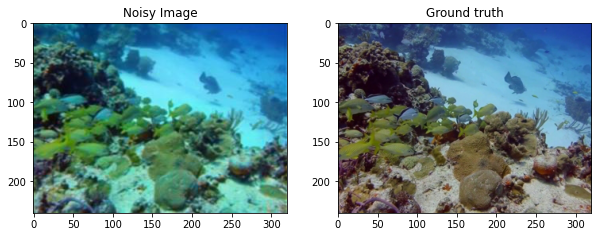

,Input,Output,Ground Truth
PSNR,27.6203,inf,inf
SSIM,0.8193,1.0000,1.0000
UCIQE,6.1229,6.3451,6.3451
UIQM,2.9359,3.2875,3.2875


In [ ]:
f = np.random.choice(files1)
img1 = plt.imread(os.path.join(path,"trainA",f))
img2 = plt.imread(os.path.join(path,"trainB",f))

plt.figure(figsize=(10,5))
plt.subplot(121)
plt.imshow(img1)
plt.title("Noisy Image")
plt.subplot(122)
plt.imshow(img2)
plt.title("Ground truth")
plt.show()

# plot_images(img1,img2,img2)
print_metrics(img1,img2,img2)

## Algorithms

### Color Correction

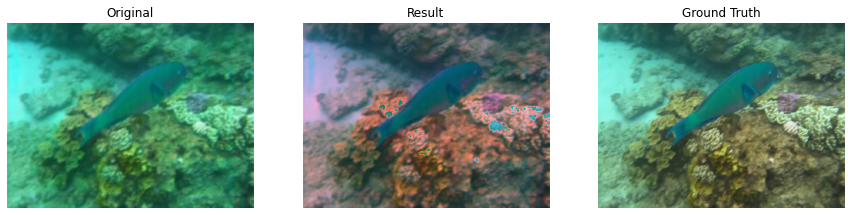

,Input,Output,Ground Truth
PSNR,28.7447,29.0249,inf
SSIM,0.8418,0.8297,1.0000
UCIQE,3.8444,4.4078,4.0582
UIQM,2.8004,3.0290,3.3522


In [ ]:
def color_correction(img):
    # https://ieeexplore.ieee.org/document/8408143

    r,g,b = cv2.split(img)
    avg = np.mean(img)

    r = (r * (avg/np.mean(r))).astype(np.uint8)
    g = (g * (avg/np.mean(g))).astype(np.uint8)
    b = (b * (avg/np.mean(b))).astype(np.uint8)

    output = cv2.merge((r,g,b))
    return output

output = color_correction(img1)

plot_images(img1,output,img2)
print_metrics(img1,output,img2)

###  Local Color Correction

#### RGB LCC

In [ ]:
# RGBLCC
def RGBLCC(I):
    # Extract the three color chanels
    I = I/255
    r,g,b=cv2.split(I)
    # I=cv2.merge((r,g,b))

    #Calculating the fft of the chanels
    DFT2d_r=np.fft.fft2(r)
    DFT2d_g=np.fft.fft2(g)
    DFT2d_b=np.fft.fft2(b)
    [M,N,C]=I.shape

    #Calculate the gaussian 
    sigma=1;
    Nr = np.fft.ifftshift(np.arange(-np.fix(M/2),np.ceil(M/2)))
    Nc = np.fft.ifftshift(np.arange(-np.fix(N/2),np.ceil(N/2)))

    [Nc,Nr] = np.meshgrid(Nc,Nr)
    dft_gauss_kernel=np.exp(-2*(sigma**2)*(np.pi**2)*((Nr/M)**2+(Nc/N)**2))

    #Convolution of both ffts
    # import numpy.matlib
    DFT2d_r_convolved=np.multiply(DFT2d_r,dft_gauss_kernel)
    DFT2d_g_convolved=np.multiply(DFT2d_g,dft_gauss_kernel)
    DFT2d_b_convolved=np.multiply(DFT2d_b,dft_gauss_kernel)

     # calculate the inverse, choosing only the real values of each chanel
    r_convolved=np.fft.ifft2(DFT2d_r_convolved)
    MRed=np.real(r_convolved)

    g_convolved=np.fft.ifft2(DFT2d_g_convolved)
    MGreen=np.real(g_convolved)

    b_convolved=np.fft.ifft2(DFT2d_b_convolved)
    MBlue=np.real(b_convolved)

    output=np.zeros((M,N,3))

     # Application of LLC
    output=np.zeros((M,N,3))
    for i in range(M):
        for j in range(N):
            output[i,j,0]=(r[i,j])**(2**(2*MRed[i,j]-1))
            output[i,j,1]=(g[i,j])**(2**(2*MGreen[i,j]-1))
            output[i,j,2]=(b[i,j])**(2**(2*MBlue[i,j]-1))

    # plt.imshow(output)
    # plt.title("Result")
    # plt.show()
    # plt.figure(figsize=(8,8)) 
    # plt.subplot(2,2,1) 
    # plt.imshow(I),
    # plt.title('Original Image')
    # plt.subplot(2,2,2)
    # plt.imshow(output)
    # plt.title('Result')
    # plt.subplot(2,2,3)
    # plt.hist(np.mean(I,2).ravel(),256,[0,1])
    # plt.title('Histogram 1')
    # plt.subplot(2,2,4)
    # plt.hist(np.mean(output,2).ravel(),256,[0,1])
    # plt.title('Histogram 2')
    # plt.show()

    return (output*255).astype(np.uint8)

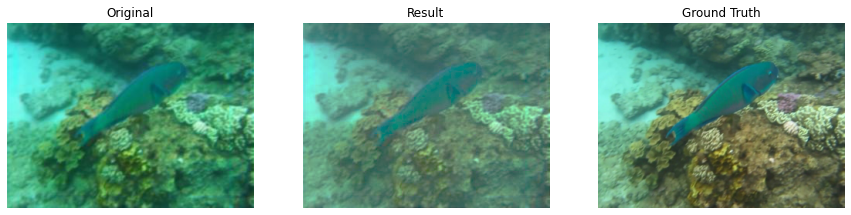

,Input,Output,Ground Truth
PSNR,28.7447,28.3244,inf
SSIM,0.8418,0.7900,1.0000
UCIQE,3.8444,3.2261,4.0582
UIQM,2.8004,3.0903,3.3522


In [ ]:
output= RGBLCC(img1)

plot_images(img1,output,img2)
print_metrics(img1,output,img2)

#### HSV LCC

In [ ]:
def HSVLCC(I):

    hsv = cv2.cvtColor(I, cv2.COLOR_RGB2HSV)

    #We put Value=Intensity of the image in the following
    Value=hsv[:,:,2]/255

    #Calculate the fft of the Intensity (Value)
    DFT2d_Value=np.fft.fft2(Value)
            
    #Calculate the Gaussian
    [M , N]=Value.shape
    sigma=4
    Nr = np.fft.ifftshift(np.arange(-np.fix(M/2),np.ceil(M/2)))
    Nc = np.fft.ifftshift(np.arange(-np.fix(N/2),np.ceil(N/2)))

    [Nc,Nr] = np.meshgrid(Nc,Nr)
    dft_gauss_kernel=np.exp(-2*(sigma**2)*(np.pi**2)*((Nr/M)**2+(Nc/N)**2))
            
    #Convolution of the Gaussian_fft and the intesity_fft
    DFT2d_Value_convolved=np.multiply(DFT2d_Value,dft_gauss_kernel)

    #Calculate the inverse, and take the real values
    Value_convolved=np.fft.ifft2(DFT2d_Value_convolved)
    MValue=np.real(Value_convolved)

    #Application of the LCC formula
    output=np.zeros((M,N,3))
    for i in range(M):
        for j in range(N):
            output[i,j,2]=(Value[i,j])**(2**(2*MValue[i,j]-1))
            
    #Output will have the same Hue and Saturation values, and we change the intensity
    output[:,:,1]=hsv[:,:,1]/255
    output[:,:,0]=hsv[:,:,0]/255

    img_rgb1= cv2.cvtColor((output*255).astype(np.uint8), cv2.COLOR_HSV2RGB)
    return img_rgb1
    

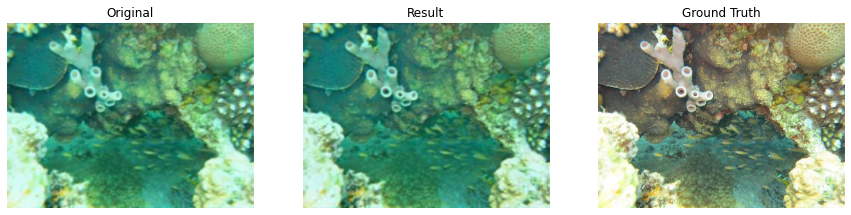

,Input,Output,Ground Truth
PSNR,28.4271,28.2789,inf
SSIM,0.7250,0.7194,1.0000
UCIQE,4.4640,3.9818,5.5231
UIQM,3.0983,3.1060,3.5711


In [ ]:
output= HSVLCC(img1)

plot_images(img1,output,img2)
print_metrics(img1,output.astype(np.uint8),img2)

#### HSL LCC

In [ ]:
def HSLLCC(I):    
    # Extract the three color chanels
    # I = I

    hls = cv2.cvtColor(I, cv2.COLOR_RGB2HLS)
    print(np.max(hls))

    #We Lum of the image in the following
    Lum=hls[:,:,1]/255

    #Calculate the fft of the Lum
    DFT2d_Lum=np.fft.fft2(Lum)
            
    #Calculate the Gaussian
    [M , N]=Lum.shape
    sigma=4
    Nr = np.fft.ifftshift(np.arange(-np.fix(M/2),np.ceil(M/2)))
    Nc = np.fft.ifftshift(np.arange(-np.fix(N/2),np.ceil(N/2)))

    [Nc,Nr] = np.meshgrid(Nc,Nr)
    dft_gauss_kernel=np.exp(-2*(sigma**2)*(np.pi**2)*((Nr/M)**2+(Nc/N)**2))
            
    #Convolution of the Gaussian_fft and the intesity_fft
    DFT2d_Lum_convolved=np.multiply(DFT2d_Lum,dft_gauss_kernel)

    #Calculate the inverse, and take the real values
    Lum_convolved=np.fft.ifft2(DFT2d_Lum_convolved)
    MLum=np.real(Lum_convolved)

    #Application of the LCC formula
    output=np.zeros((M,N,3))
    for i in range(M):
        for j in range(N):
            output[i,j,1]=(Lum[i,j])**(2**(2*MLum[i,j]-1))
            
    #Output will have the same Hue and Saturation values, and we change the intensity
    output[:,:,2]=hls[:,:,2]/255
    output[:,:,0]=hls[:,:,0]/255
    img_rgb1= cv2.cvtColor((output*255).astype(np.uint8), cv2.COLOR_HLS2RGB)
    return img_rgb1

255


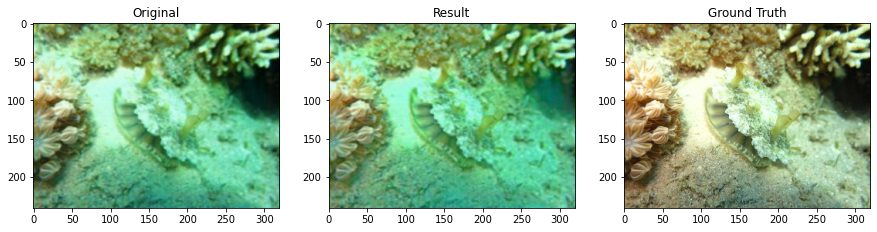

,Input,Output,Ground Truth
PSNR,28.7732,28.3012,inf
SSIM,0.8011,0.7524,1.0000
UCIQE,5.1420,4.8089,4.9158
UIQM,3.0914,3.1106,3.1818


In [ ]:
output= HSLLCC(img1)

plot_images(img1,output,img2)
print_metrics(img1,output.astype(np.uint8),img2)

### Simplest Color Balance

In [ ]:
# Simplest Color Balance

def apply_mask(matrix, mask, fill_value):
    masked = np.ma.array(matrix, mask=mask, fill_value=fill_value)
    return masked.filled()

def apply_threshold(matrix, low_value, high_value):
    low_mask = matrix < low_value
    matrix = apply_mask(matrix, low_mask, low_value)

    high_mask = matrix > high_value
    matrix = apply_mask(matrix, high_mask, high_value)

    return matrix

def SimplestColorBalance(img, percent = 3):
    
    assert img.shape[2] == 3
    assert 0 <= percent <= 100

    half_percent = percent / 200

    channels = cv2.split(img)

    out_channels = []
    for channel in channels:
        assert len(channel.shape) == 2
        # find the low and high precentile values (based on the input percentile)
        height, width = channel.shape[:2]
        vec_size = width * height
        flat = channel.reshape(vec_size)

        assert len(flat.shape) == 1

        low_val = np.percentile(flat, half_percent * 100)
        high_val = np.percentile(flat, (1 - half_percent) * 100)

        # saturate below the low percentile and above the high percentile
        thresholded = apply_threshold(channel, low_val, high_val)

        # scale the channel
        normalized = cv2.normalize(thresholded, thresholded.copy(), 0, 255, cv2.NORM_MINMAX)
        out_channels.append(normalized)

    return cv2.merge(out_channels)


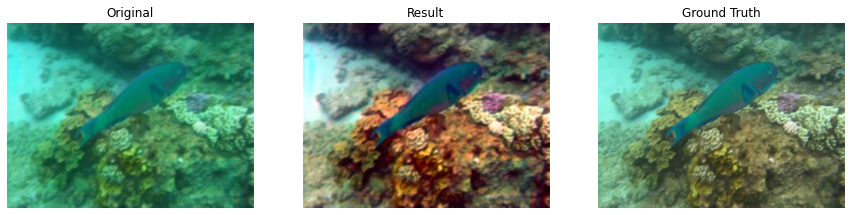

,Input,Output,Ground Truth
PSNR,28.7447,28.1348,inf
SSIM,0.8418,0.8050,1.0000
UCIQE,3.8444,5.6366,4.0582
UIQM,2.8004,2.8845,3.3522


In [ ]:
output=SimplestColorBalance(img1, 3)

plot_images(img1,output,img2)
print_metrics(img1,output,img2)

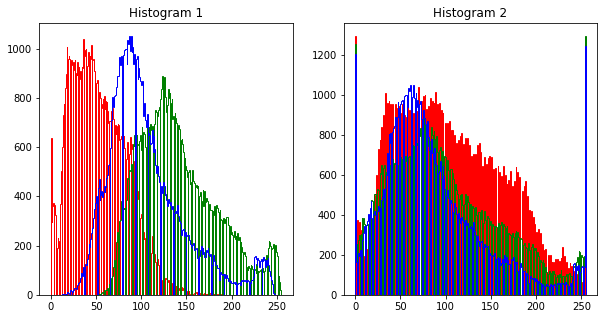

In [ ]:
plt.figure(figsize=(10,5))
plt.subplot(121)
plt.hist(img1[:,:,0].ravel(),256, color='red', histtype= 'step')
plt.hist(img1[:,:,1].ravel(),256, color='green', histtype= 'step')
plt.hist(img1[:,:,2].ravel(),256, color='blue', histtype= 'step')
plt.title('Histogram 1')
plt.subplot(122)
plt.hist(output[:,:,0].ravel(),256, color='red' , histtype= 'step')
plt.hist(output[:,:,1].ravel(),256, color='green', histtype= 'step')
plt.hist(output[:,:,2].ravel(),256, color='blue', histtype= 'step')
plt.title('Histogram 2')
plt.show()

### Screened Poisson equation

In [ ]:
# Screened Poisson equation

def periodique( imageData ):
    [M,N]=imageData.shape
    img_prd=np.zeros((M*2,N*2))
    img_prd[:M,:N]=imageData
    img_prd[M:M*2,:N]=np.flipud(imageData)
    img_prd[:M,N:N*2]=np.fliplr(imageData)
    img_prd[M:M*2,N:N*2]=np.fliplr(np.flipud(imageData))
    
    return img_prd


def Poisson(img,s,lambda_value):
    img = img/255
    # img=cv2.imread(image)
    r,g,b=cv2.split(img)
    imageData=img

    # blue,green,red=cv2.split(imageData)

    img_sat=SimplestColorBalance(imageData,s)
    img_sat_red,img_sat_green,img_sat_blue=cv2.split(img_sat)

    #Periodisation
    img_prd_red=periodique(img_sat_red)
    img_prd_green=periodique(img_sat_green)
    img_prd_blue=periodique(img_sat_blue)

    #Calcule des FFTs
    fft_img_red=(np.fft.fft2(img_prd_red))
    fft_img_green=(np.fft.fft2(img_prd_green))
    fft_img_blue=(np.fft.fft2(img_prd_blue))

    [J,L]=fft_img_red.shape
    fft_u_red=np.zeros((J,L))
    fft_u_green=np.zeros((J,L))
    fft_u_blue=np.zeros((J,L))


    #Application de la formule de poisson sur chaque canal
    for m in range(J):
        for n in range(L):
            fft_u_red[m,n]=(((np.pi*m/J)**2+(np.pi*n/L)**2)/(lambda_value+(np.pi*m/J)**2+(np.pi*n/L)**2))*fft_img_red[m,n]
            fft_u_green[m,n]=(((np.pi*m/J)**2+(np.pi*n/L)**2)/(lambda_value+(np.pi*m/J)**2+(np.pi*n/L)**2))*fft_img_green[m,n]
            fft_u_blue[m,n]=(((np.pi*m/J)**2+(np.pi*n/L)**2)/(lambda_value+(np.pi*m/J)**2+(np.pi*n/L)**2))*fft_img_blue[m,n]

    [M,N,L]=imageData.shape
    #calcule de l'inverse, prendre la partie réelle
    u_red=np.real(np.fft.ifft2(fft_u_red))
    u_green=np.real(np.fft.ifft2(fft_u_green))
    u_blue=np.real(np.fft.ifft2(fft_u_blue))

    #saturation
    img1=cv2.merge((u_red[:M,:N],u_green[:M,:N],u_blue[:M,:N]))
    result=SimplestColorBalance(img1,s)
    # result=np.clip(result,0,255)
    
    return result.astype(np.uint8)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:44: ComplexWarning: Casting complex values to real discards the imaginary part
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:45: ComplexWarning: Casting complex values to real discards the imaginary part
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:46: ComplexWarning: Casting complex values to real discards the imaginary part


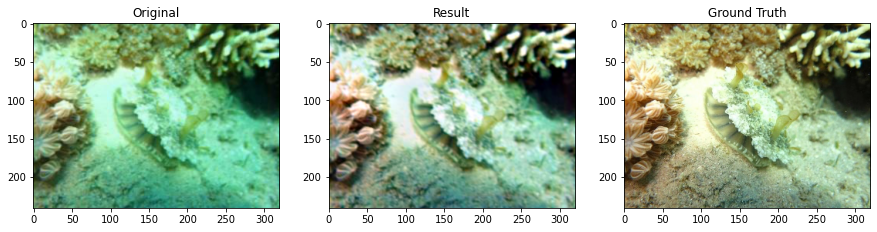

,Input,Output,Ground Truth
PSNR,28.7732,28.6855,inf
SSIM,0.8011,0.7587,1.0000
UCIQE,5.1420,4.9285,4.9158
UIQM,3.0914,2.9765,3.1818


In [ ]:
s=2
lambda_value=0.001
output = Poisson(img1,s,lambda_value)

plot_images(img1,output,img2)
print_metrics(img1,output,img2)


### CLAHE

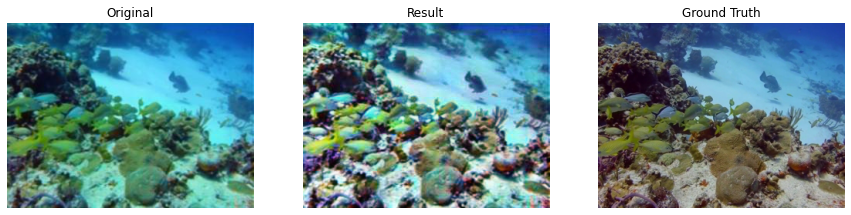

,Input,Output,Ground Truth
PSNR,27.6203,28.1206,inf
SSIM,0.8193,0.7220,1.0000
UCIQE,6.1229,6.2860,6.3451
UIQM,2.9359,3.2970,3.2875


In [ ]:
# CLAHE
def clahe(img1):
    cl = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    r,g,b=cv2.split(img1)
    output_r = cl.apply(r)
    output_g = cl.apply(g)
    output_b = cl.apply(b)
    output = cv2.merge((output_r, output_g, output_b))
    return output

output = clahe(img1)
plot_images(img1,output,img2)
print_metrics(img1,output,img2)

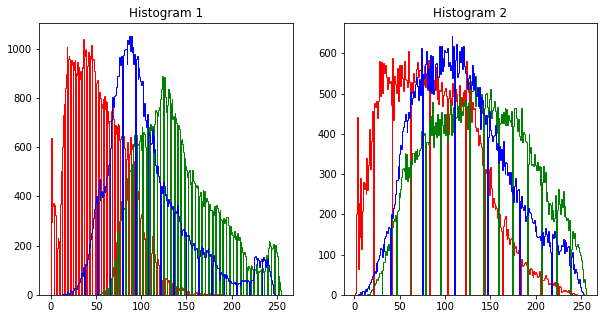

In [ ]:
plt.figure(figsize=(10,5))
plt.subplot(121)
plt.hist(img1[:,:,0].ravel(),256, color='red', histtype= 'step')
plt.hist(img1[:,:,1].ravel(),256, color='green', histtype= 'step')
plt.hist(img1[:,:,2].ravel(),256, color='blue', histtype= 'step')
plt.title('Histogram 1')
plt.subplot(122)
plt.hist(output[:,:,0].ravel(),256, color='red' , histtype= 'step')
plt.hist(output[:,:,1].ravel(),256, color='green', histtype= 'step')
plt.hist(output[:,:,2].ravel(),256, color='blue', histtype= 'step')
plt.title('Histogram 2')
plt.show()

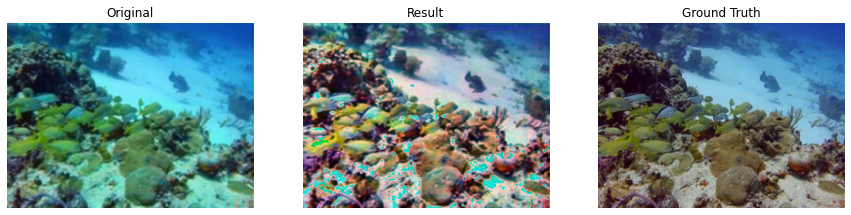

,Input,Output,Ground Truth
PSNR,27.6203,28.1752,inf
SSIM,0.8193,0.6809,1.0000
UCIQE,6.1229,6.4642,6.3451
UIQM,2.9359,3.1962,3.2875


In [ ]:
# CLAHE + color correction
def clahe(img1):
    cl = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    r,g,b=cv2.split(img1)
    output_r = cl.apply(r)
    output_g = cl.apply(g)
    output_b = cl.apply(b)
    output = cv2.merge((output_r, output_g, output_b))
    return output

output = color_correction(clahe(img1))
plot_images(img1,output,img2)
print_metrics(img1,output,img2)

### Median filtering

In [ ]:
#Function to pad an image
def padding(img,pad):
    padded_img = np.zeros((img.shape[0]+2*pad,img.shape[1]+2*pad))
    padded_img[pad:-pad,pad:-pad] = img
    return padded_img

#Filter an image using Adaptive Median Filter (AMF)
def AdaptiveMedianFilter(img,s=3,sMax=7):
    H,W = img.shape
    a = sMax//2
    padded_img = padding(img,a)
    #f_img = np.zeros(padded_img.shape)

    for i in range(a,H+a+1):
        for j in range(a,W+a+1):
            value = Lvl_A(padded_img,i,j,s,sMax)
            padded_img[i,j] = value

    return padded_img[a:-a,a:-a].astype(np.uint8) 

#Level A of Adaptive median filter
def Lvl_A(mat,x,y,s,sMax):
    window = mat[x-(s//2):x+(s//2)+1,y-(s//2):y+(s//2)+1]
    Zmin = np.min(window)
    Zmed = np.median(window)
    Zmax = np.max(window)

    if Zmin < Zmed < Zmax:
        return Lvl_B(window, Zmin, Zmed, Zmax)
    else:
        s += 2 
        if s <= sMax:
            return Lvl_A(mat,x,y,s,sMax)
        else:
             return Zmed

#Level B of Adaptive median filter
def Lvl_B(window, Zmin, Zmed, Zmax):
    h,w = window.shape

    Zxy = window[h//2,w//2]
    if Zmin < Zxy < Zmax:
        return Zxy
    else:
        return Zmed
    
#Filter an image using Decision Based Median Filtering(DBMF)
def DecisionBasedFilter(img,s=3):
    H,W = img.shape
    a = s//2
    padded_img = padding(img,a)
    #f_img = np.zeros(padded_img.shape)

    for i in range(a,H+a+1):
        for j in range(a,W+a+1):
            value = Step_DBF(padded_img,i,j,s)
            padded_img[i,j] = value

    return padded_img[a:-a,a:-a] 

# Step B for DBMF
def Step_DBF(mat,x,y,s):
    window = mat[x-(s//2):x+(s//2)+1,y-(s//2):y+(s//2)+1]
    Zmin = np.min(window)
    Zmed = np.median(window).astype(np.uint8)
    Zmax = np.max(window)
    Zxy = mat[x,y]

    if Zmin < Zxy < Zmax:
        return Zxy
    elif (Zmin < Zmed < Zmax) or (0<Zmed<255):
        return Zmed
    else:
        return mat[x-1,y]
    
#Filter an image using Adaptive Decision Based Median Filtering(ADBMF)    
def AdaptiveDecisionMedianFilter(img,s=3,sMax=7):
    H,W = img.shape
    a = sMax//2
    padded_img = padding(img,a)

    #f_img = np.zeros(padded_img.shape)

    for i in range(a,H+a+1):
        for j in range(a,W+a+1):
            value = Step_ADBF(padded_img,i,j,s,sMax)
            padded_img[i,j] = value

    return padded_img[a:-a,a:-a] 

# Step B for ADBMF
def Step_ADBF(mat,x,y,s,sMax):
    window = mat[x-(s//2):x+(s//2)+1,y-(s//2):y+(s//2)+1]
    Zmin = np.min(window)
    Zmed = np.median(window).astype(np.uint8)
    Zmax = np.max(window)
    Zxy = mat[x,y]

    if Zmin < Zxy < Zmax:
        return Zxy
    elif (Zmin < Zmed < Zmax) or (0<Zmed<255):
        return Zmed
    else:
        s += 2 
        if s <= sMax:
            return Step_ADBF(mat,x,y,s,sMax)
        else:
             return mat[x-1,y]

#### AMF

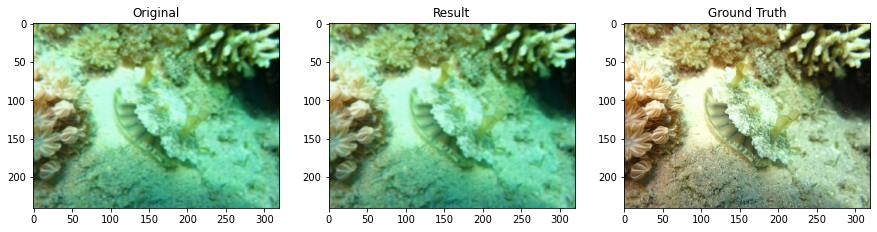

,Input,Output,Ground Truth
PSNR,28.7732,28.7647,inf
SSIM,0.8011,0.7865,1.0000
UCIQE,5.1420,5.1437,4.9158
UIQM,3.0914,3.1333,3.1818


In [ ]:
def AMF(img1,filter_size = 3, w_max = 7 ):
    r,g,b = cv2.split(img1)
    output_r = AdaptiveMedianFilter(r, filter_size,w_max)
    output_g = AdaptiveMedianFilter(g, filter_size,w_max)
    output_b = AdaptiveMedianFilter(b, filter_size,w_max)
    return cv2.merge((output_r,output_g,output_b))

output = AMF(img1)
plot_images(img1,output,img2)
print_metrics(img1,output,img2)

## Run over full set

In [ ]:
root = "/content/drive/MyDrive/ECE6258/Paired"
folder_list = ["underwater_dark","underwater_imagenet","underwater_scenes"]

files = {}
for f in folder_list:
    files[f] = np.sort(os.listdir(os.path.join(root,f,"trainA")))
    print(f, ":",len(files[f]))

underwater_dark : 5550
underwater_imagenet : 3700
underwater_scenes : 2185


### CLAHE

Algo: CLAHE N:2 Folder: underwater_dark


,Input,Output,Ground Truth
PSNR,27.9693,28.0332,inf
SSIM,0.8359,0.7232,1.0000
UCIQE,3.4405,3.6506,4.0298
UIQM,2.8607,3.1829,3.1731


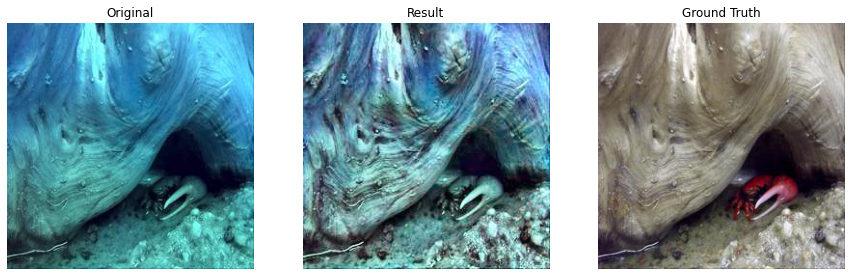

Algo: CLAHE N:2 Folder: underwater_imagenet


,Input,Output,Ground Truth
PSNR,28.2891,27.9053,inf
SSIM,0.7245,0.5347,1.0000
UCIQE,4.2207,3.9508,3.6414
UIQM,2.6828,3.1723,2.7300


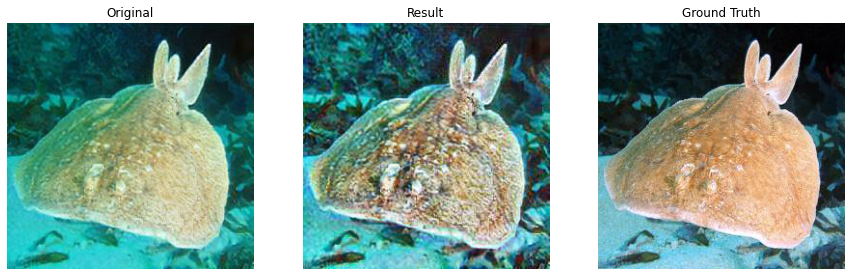

Algo: CLAHE N:2 Folder: underwater_scenes


,Input,Output,Ground Truth
PSNR,28.8467,28.4720,inf
SSIM,0.7200,0.6744,1.0000
UCIQE,4.8415,5.5830,5.4461
UIQM,2.3487,2.8285,2.5878


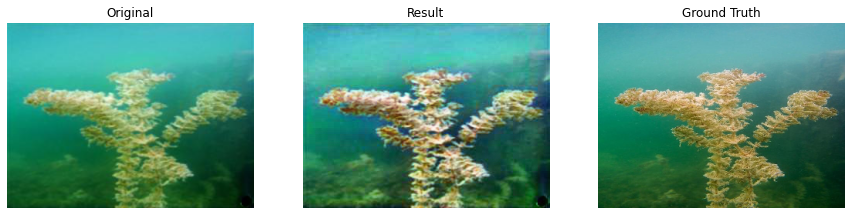

In [ ]:
N = 2 #Number of images from each folder

for folder in folder_list:
    metrics = np.zeros((4,3,N))

    for i,f in enumerate(files[folder][:N]):
        img1 = plt.imread(os.path.join(root,folder,"trainA",f))
        img2 = plt.imread(os.path.join(root,folder,"trainB",f))
        output = clahe(img1)
        metrics[:,:,i] = print_metrics(img1,output,img2, show = False)

    # Get mean metrics
    metrics_mean = np.mean(metrics, axis = 2)

    # Display mean metrics table
    df_metrics_mean = metrics_table(metrics_mean)
    print("Algo: CLAHE" + " N:"+str(N)+ " Folder: "+ folder )
    display(df_metrics_mean.astype(float).round(decimals=4))
    plot_images(img1,output,img2)


### CLAHE + Color Correction

Algo: CLAHE + Color Correction N:500 Folder: underwater_dark


,Input,Output,Ground Truth
PSNR,28.5049,28.1725,inf
SSIM,0.8116,0.6814,1.0000
UCIQE,3.4945,4.3761,5.4507
UIQM,2.5026,3.0644,2.8145


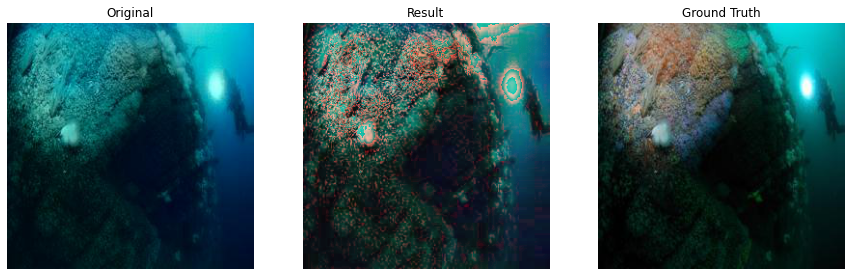

Algo: CLAHE + Color Correction N:500 Folder: underwater_imagenet


,Input,Output,Ground Truth
PSNR,28.0215,28.1012,inf
SSIM,0.7080,0.6188,1.0000
UCIQE,4.1344,5.1013,3.8207
UIQM,2.4190,2.9766,2.9367


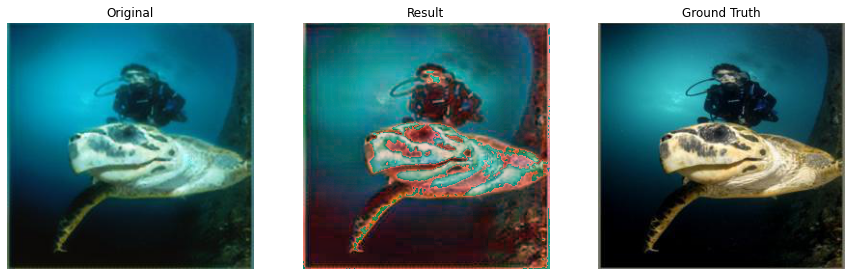

Algo: CLAHE + Color Correction N:500 Folder: underwater_scenes


,Input,Output,Ground Truth
PSNR,28.6864,28.2014,inf
SSIM,0.7142,0.6176,1.0000
UCIQE,4.6877,5.8936,5.4565
UIQM,2.5597,2.9754,2.8134


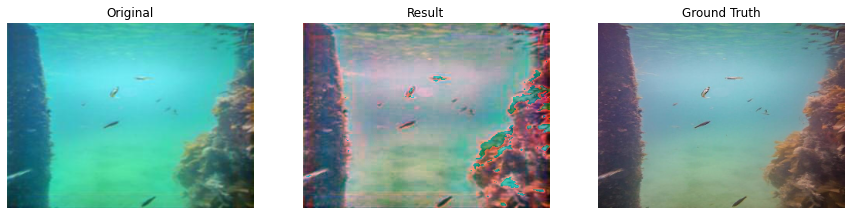

In [ ]:
N = 500 #Number of images from each folder

for folder in folder_list:
    metrics = np.zeros((4,3,N))

    for i,f in enumerate(files[folder][:N]):
        img1 = plt.imread(os.path.join(root,folder,"trainA",f))
        img2 = plt.imread(os.path.join(root,folder,"trainB",f))
        output = color_correction(clahe(img1))
        metrics[:,:,i] = print_metrics(img1,output,img2, show = False)

    # Get mean metrics
    metrics_mean = np.mean(metrics, axis = 2)

    # Display mean metrics table
    df_metrics_mean = metrics_table(metrics_mean)
    print("Algo: CLAHE + Color Correction" + " N:"+str(N)+ " Folder: "+ folder )
    display(df_metrics_mean.astype(float).round(decimals=4))
    plot_images(img1,output,img2)

### AMF

In [ ]:
N = 30 #Number of images from each folder

for folder in folder_list:
    metrics = np.zeros((4,3,N))

    for i,f in enumerate(files[folder][:N]):
        img1 = plt.imread(os.path.join(root,folder,"trainA",f))
        img2 = plt.imread(os.path.join(root,folder,"trainB",f))
        output = AMF(img1)
        metrics[:,:,i] = print_metrics(img1,output,img2, show = False)

    # Get mean metrics
    metrics_mean = np.mean(metrics, axis = 2)

    # Display mean metrics table
    df_metrics_mean = metrics_table(metrics_mean)
    print("Algo: AMF" + " N:"+str(N)+ " Folder: "+ folder )
    display(df_metrics_mean.astype(float).round(decimals=4))
    plot_images(img1,output,img2)

### AMF + Color Correction

Algo: AMF + Color Correction N:30 Folder: underwater_dark


,Input,Output,Ground Truth
PSNR,28.2986,28.5483,inf
SSIM,0.7985,0.7387,1.0000
UCIQE,3.5508,3.5780,5.6404
UIQM,2.5533,2.9008,2.8703


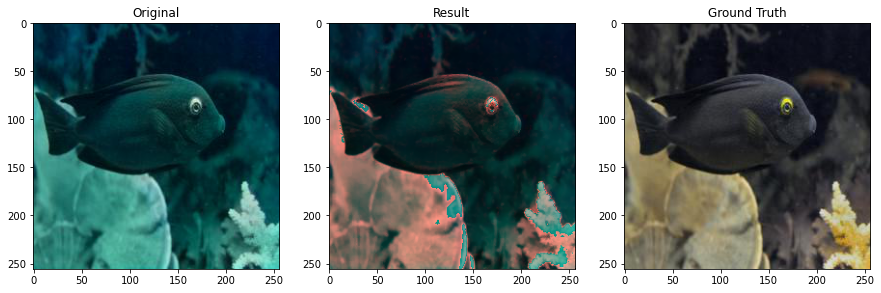

Algo: AMF + Color Correction N:30 Folder: underwater_imagenet


,Input,Output,Ground Truth
PSNR,27.8936,28.4308,inf
SSIM,0.6767,0.6835,1.0000
UCIQE,4.4099,4.8615,3.8974
UIQM,2.3114,2.5728,2.9630


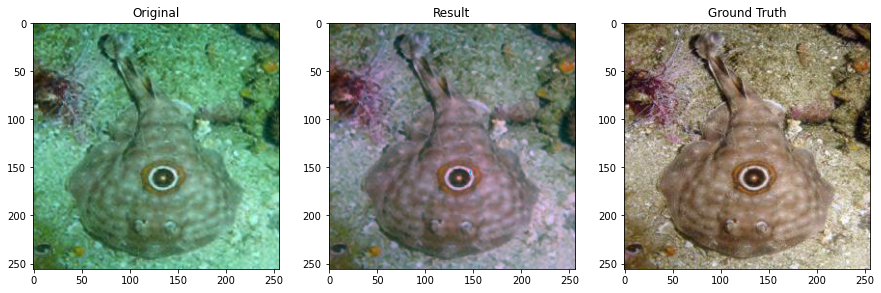

Algo: AMF + Color Correction N:30 Folder: underwater_scenes


,Input,Output,Ground Truth
PSNR,28.7291,28.5610,inf
SSIM,0.7119,0.6515,1.0000
UCIQE,5.1128,5.4068,5.9383
UIQM,2.5212,2.6341,2.7917


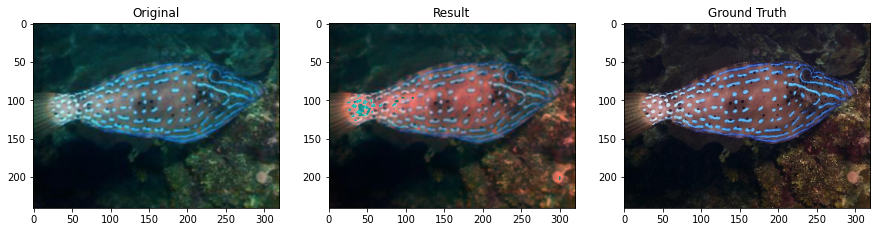

In [ ]:
N = 30 #Number of images from each folder

for folder in folder_list:
    metrics = np.zeros((4,3,N))

    for i,f in enumerate(files[folder][:N]):
        img1 = plt.imread(os.path.join(root,folder,"trainA",f))
        img2 = plt.imread(os.path.join(root,folder,"trainB",f))
        output = color_correction(AMF(img1))
        metrics[:,:,i] = print_metrics(img1,output,img2, show = False)

    # Get mean metrics
    metrics_mean = np.mean(metrics, axis = 2)

    # Display mean metrics table
    df_metrics_mean = metrics_table(metrics_mean)
    print("Algo: AMF + Color Correction" + " N:"+str(N)+ " Folder: "+ folder )
    display(df_metrics_mean.astype(float).round(decimals=4))
    plot_images(img1,output,img2)

### Simplest Color Balance

N:500 Folder: underwater_dark


,Input,Output,Ground Truth
PSNR,28.5049,28.4604,inf
SSIM,0.8116,0.8041,1.0000
UCIQE,3.4945,3.7676,5.4507
UIQM,2.5026,2.2449,2.8145


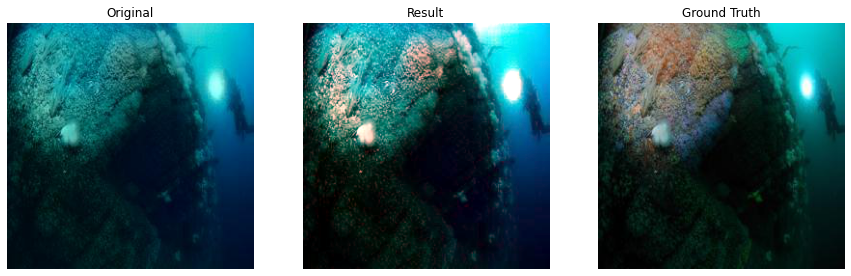

N:500 Folder: underwater_imagenet


,Input,Output,Ground Truth
PSNR,28.0215,28.2131,inf
SSIM,0.7080,0.7201,1.0000
UCIQE,4.1344,5.4238,3.8207
UIQM,2.4190,2.3963,2.9367


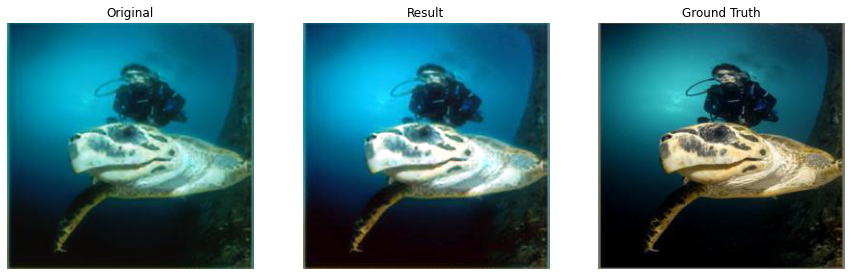

N:500 Folder: underwater_scenes


,Input,Output,Ground Truth
PSNR,28.6864,28.4060,inf
SSIM,0.7142,0.7032,1.0000
UCIQE,4.6877,6.3844,5.4565
UIQM,2.5597,2.4897,2.8134


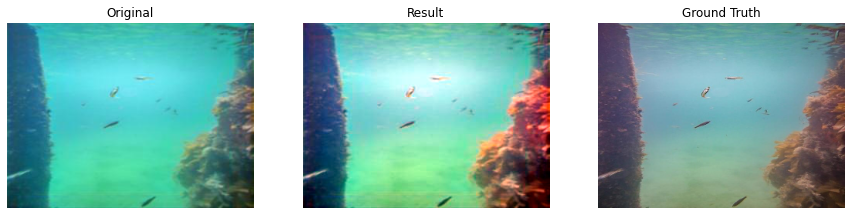

In [ ]:
N = 500 #Number of images from each folder

for folder in folder_list:
    metrics = np.zeros((4,3,N))

    for i,f in enumerate(files[folder][:N]):
        img1 = plt.imread(os.path.join(root,folder,"trainA",f))
        img2 = plt.imread(os.path.join(root,folder,"trainB",f))
        output = SimplestColorBalance(img1)
        metrics[:,:,i] = print_metrics(img1,output,img2, show = False)

    # Get mean metrics
    metrics_mean = np.mean(metrics, axis = 2)

    # Display mean metrics table
    df_metrics_mean = metrics_table(metrics_mean)
    print("N:"+str(N)+ " Folder: "+ folder )
    display(df_metrics_mean.astype(float).round(decimals=4))
    plot_images(img1,output,img2)

### CLAHE + Simplest Color Balance

N:3 Folder: underwater_dark


,Input,Output,Ground Truth
PSNR,27.8467,28.0833,inf
SSIM,0.7963,0.6037,1.0000
UCIQE,3.7578,4.5389,3.5708
UIQM,2.6779,2.5339,3.0489


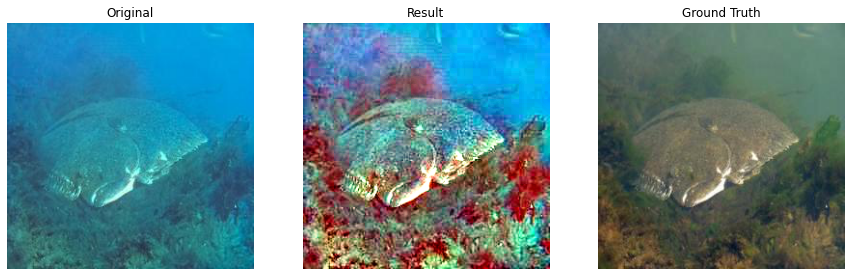

N:3 Folder: underwater_imagenet


,Input,Output,Ground Truth
PSNR,28.1159,28.1500,inf
SSIM,0.7295,0.5459,1.0000
UCIQE,4.9838,4.8820,4.6689
UIQM,2.7371,2.5707,2.7190


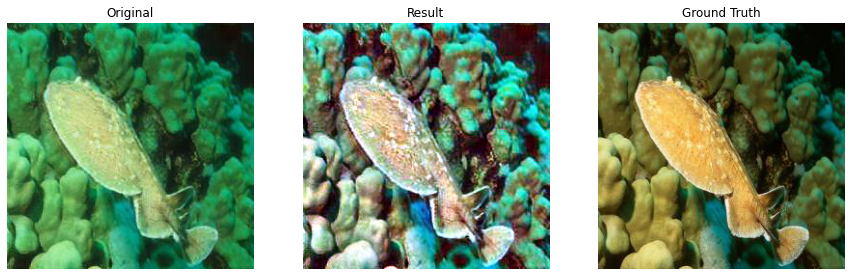

N:3 Folder: underwater_scenes


,Input,Output,Ground Truth
PSNR,28.7203,28.2720,inf
SSIM,0.7504,0.6311,1.0000
UCIQE,5.2586,6.4819,5.2100
UIQM,2.5367,2.4415,2.8297


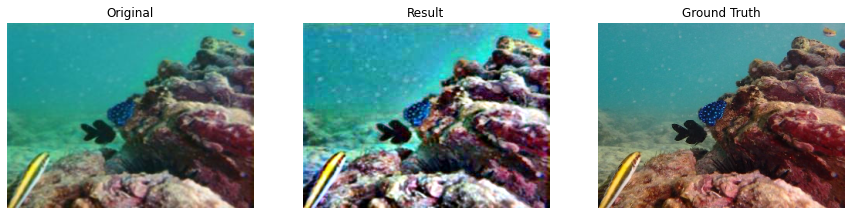

In [ ]:
N = 3 #Number of images from each folder

for folder in folder_list:
    metrics = np.zeros((4,3,N))

    for i,f in enumerate(files[folder][:N]):
        img1 = plt.imread(os.path.join(root,folder,"trainA",f))
        img2 = plt.imread(os.path.join(root,folder,"trainB",f))
        output = SimplestColorBalance(clahe(img1))
        metrics[:,:,i] = print_metrics(img1,output,img2, show = False)

    # Get mean metrics
    metrics_mean = np.mean(metrics, axis = 2)

    # Display mean metrics table
    df_metrics_mean = metrics_table(metrics_mean)
    print("N:"+str(N)+ " Folder: "+ folder )
    display(df_metrics_mean.astype(float).round(decimals=4))
    plot_images(img1,output,img2)

## Deep learning

In [ ]:
# cd /content/drive/MyDrive/ECE6258
# !git clone https://github.com/xahidbuffon/FUnIE-GAN

In [ ]:
!cd /content/drive/MyDrive/ECE6258/FUnIE-GAN/PyTorch

!pip install -U PyYAML 

     |████████████████████████████████| 596 kB 5.2 MB/s 
  Attempting uninstall: PyYAML
    Found existing installation: PyYAML 3.13
    Uninstalling PyYAML-3.13:
      Successfully uninstalled PyYAML-3.13


In [ ]:
cd /content/drive/MyDrive/ECE6258/FUnIE-GAN/PyTorch

/content/drive/MyDrive/ECE6258/FUnIE-GAN/PyTorch


### Train

In [ ]:
!python train_funiegan.py --num_epochs=10 --batch_size=8 --lr=0.0003

Downloading: "https://download.pytorch.org/models/vgg19-dcbb9e9d.pth" to /root/.cache/torch/hub/checkpoints/vgg19-dcbb9e9d.pth
100% 548M/548M [00:10<00:00, 55.5MB/s]
/usr/local/lib/python3.7/dist-packages/torchvision/transforms/transforms.py:288: UserWarning: Argument interpolation should be of type InterpolationMode instead of int. Please, use InterpolationMode enum.
  "Argument interpolation should be of type InterpolationMode instead of int. "
[Epoch 0/10: batch 950/1430] [DLoss: 2.285, GLoss: 2.769, AdvLoss: 0.370]

### Test

In [ ]:
!python test.py --model_name="funiegan" --sample_dir="output" \
--data_dir="/content/drive/MyDrive/ECE6258/Paired/underwater_imagenet/validation"

In [ ]:
import shutil

In [ ]:
# !zip "/content/drive/MyDrive/ECE6258/dark.zip" "/content/drive/MyDrive/ECE6258/Paired/underwater_dark"

  adding: content/drive/MyDrive/ECE6258/Paired/underwater_dark/ (stored 0%)


In [ ]:
shutil.make_archive('/content/drive/MyDrive/ECE6258/dark1','zip','/content/drive/MyDrive/ECE6258/Paired/underwater_dark')

'/content/drive/MyDrive/ECE6258/dark1.zip'

In [ ]:
shutil.make_archive('/content/drive/MyDrive/ECE6258/image1','zip','/content/drive/MyDrive/ECE6258/Paired/underwater_imagenet')

'/content/drive/MyDrive/ECE6258/image1.zip'

In [ ]:
shutil.make_archive('/content/drive/MyDrive/ECE6258/scenes1','zip','/content/drive/MyDrive/ECE6258/Paired/underwater_scenes')

'/content/drive/MyDrive/ECE6258/scenes1.zip'